### Решение прикладной задачи о близости с помощью диаграммы Вороного

> Одной из приоритетных задач развития города Москвы является решение проблемы транспортной доступности отдаленных от центра города районов. С целью снижения нагрузки на автомобильные дороги города ведется
активная политика, направленная на расширение зон покрытия общественного транспорта. На сегодняшний день, наиболее востребованный и удобный для передвижения вид общественного транспорта Москвы − московский метрополитен. Именно вокруг станций метро формируется вся инфраструктура районов города, а транспортная доступность объектов инфраструктуры определяется расстоянием до ближайшей станции метрополитена. Из-за дороговизны, сложности и длительности строительства новый станций метрополитена правительство города выбирает наиболее нуждающиеся области, в которые входят отдаленные районы, районы с большой загруженностью автомобильных дорог, районы с большим числом жителей и так далее. Целью данной работы является получение разбиения Вороного города Москвы, состоящего из 259 областей, каждая из которых содержит одну станцию московского метрополитена. На основе разбиения можно сделать вывод о плотности расположения станций метро, а также выявить области, особенно нуждающиеся в строительстве дополнительных станций.

### Results:

In [1]:
from IPython.display import HTML
HTML('<iframe src = data/openstreetmap_itog_color_demo_moscow.html width=100% height=800>')

### A Sweepline Algorithm for Voronoi Diagrams (Steven Fortune)
http://www.wias-berlin.de/people/si/course/files/Fortune87-SweepLine-Voronoi.pdf


In [37]:
HTML('<img src="images/Fortunes-algorithm.gif">')

In [38]:
from IPython.display import YouTubeVideo

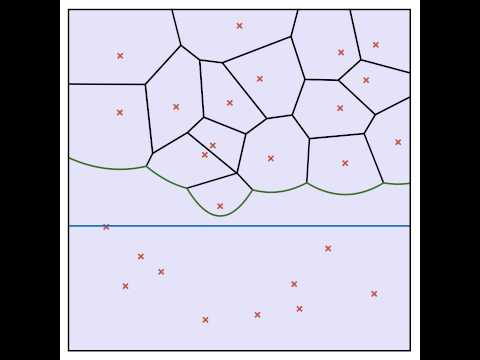

In [39]:
YouTubeVideo('k2P9yWSMaXE', width=940, height=480)

### 1) Data collection

In [40]:
import json
import requests
import copy
import folium
from folium import plugins
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import quilt
from quilt.data.ResidentMario import geoplot_data
import geopandas as gpd
import geoplot as gplt
from matplotlib.colors import ListedColormap
metro = requests.get("https://api.hh.ru/metro/1").json()

In [41]:
metro_list = list()
for line in metro['lines']:
    color_line = line['hex_color']
    name_line = line['name']
    
    for station in line['stations']:
        metro_list.append({'name_line':name_line, 'color_line':color_line,'id_station':station['id'], 'name_station':station['name'],
                           'lat':station['lat'], 'lng':station['lng']})

In [42]:
metro_list[:3]

[{'name_line': 'Калининская',
  'color_line': 'FFCD1C',
  'id_station': '8.189',
  'name_station': 'Новокосино',
  'lat': 55.745113,
  'lng': 37.864052},
 {'name_line': 'Калининская',
  'color_line': 'FFCD1C',
  'id_station': '8.88',
  'name_station': 'Новогиреево',
  'lat': 55.752237,
  'lng': 37.814587},
 {'name_line': 'Калининская',
  'color_line': 'FFCD1C',
  'id_station': '8.107',
  'name_station': 'Перово',
  'lat': 55.75098,
  'lng': 37.78422}]

In [43]:
f = open('data/moscow_metro_full.txt', 'w')
for station in metro_list:
    f.write(str(station['lat']) + " " + str(station['lng']) + " " + str(station['name_station']) + '\n')
f.close()

In [44]:
def lng_to_px(lng):
    return (lng - 37.360862)*(11600/(37.85877 - 37.360862))
def lat_to_px(lat):
    return (55.914970 - lat)*(14471/(55.914970 - 55.565500))

In [45]:
metro_px = list()
for station in metro_list:
    metro_px.append({'name':station['name_station'],'x_px':int(lng_to_px(station['lng'])), 'y_px': int(lat_to_px(station['lat']))})

In [46]:
len(metro_px)

263

In [47]:
metro_px[:6]

[{'name': 'Новокосино', 'x_px': 11723, 'y_px': 7033},
 {'name': 'Новогиреево', 'x_px': 10570, 'y_px': 6738},
 {'name': 'Перово', 'x_px': 9863, 'y_px': 6790},
 {'name': 'Шоссе Энтузиастов', 'x_px': 9105, 'y_px': 6496},
 {'name': 'Авиамоторная', 'x_px': 8307, 'y_px': 6751},
 {'name': 'Площадь Ильича', 'x_px': 7452, 'y_px': 6950}]

In [48]:
number_false_station = 0
false_station = []
for i,station in enumerate(metro_px):
    if station['x_px'] > 11600 or station['x_px'] < 0 or station['y_px'] > 14471 or station['y_px'] < 0:
        print(station)
        false_station.append(i) 
        number_false_station += 1


{'name': 'Новокосино', 'x_px': 11723, 'y_px': 7033}
{'name': 'Новопеределкино', 'x_px': -150, 'y_px': 11448}
{'name': 'Рассказовка', 'x_px': -653, 'y_px': 11700}
{'name': 'Пятницкое шоссе', 'x_px': -180, 'y_px': 2539}
{'name': 'Бунинская аллея', 'x_px': 3611, 'y_px': 15610}
{'name': 'Улица Горчакова', 'x_px': 3988, 'y_px': 15432}
{'name': 'Бульвар Адмирала Ушакова', 'x_px': 4227, 'y_px': 15311}
{'name': 'Улица Скобелевская', 'x_px': 4469, 'y_px': 15191}


In [49]:
len(metro_px)

263

In [50]:
for j in reversed(false_station):
    del metro_px[j]

In [51]:
len(metro_px)

255

In [52]:
metro_px[:6]

[{'name': 'Новогиреево', 'x_px': 10570, 'y_px': 6738},
 {'name': 'Перово', 'x_px': 9863, 'y_px': 6790},
 {'name': 'Шоссе Энтузиастов', 'x_px': 9105, 'y_px': 6496},
 {'name': 'Авиамоторная', 'x_px': 8307, 'y_px': 6751},
 {'name': 'Площадь Ильича', 'x_px': 7452, 'y_px': 6950},
 {'name': 'Марксистская', 'x_px': 6876, 'y_px': 7214}]

In [53]:
f = open('data/moscow_metro.txt', 'w')
for station in metro_px:
    f.write(str(station['x_px']) + " " + str(station['y_px']) + '\n')
f.close()

In [54]:
#find
name = "Ростокино"
for station in metro_px:
    if (station['name']==name):
       print(station)

{'name': 'Ростокино', 'x_px': 7150, 'y_px': 3127}


### 2) Add points of station on folium map

In [55]:
lats = list()
longs = list()
name_station = list()
with open("data/moscow_metro_full.txt") as file:
    for line in file:
        x, y, name = line.split(maxsplit=2)
        lats.append(float(x))
        longs.append(float(y))
        name_station.append(name)

In [56]:
places=[([x[0],x[1]]) for x in zip(lats,longs)]

maps_version = {0:'openstreetmap',
                #1:'mapquestopen',
                2:'Stamen Terrain',
                #3:'MapQuest Open Aerial',
                4:'MapBox Bright',
                5:'Mapbox Control Room',
                6:'stamentoner',
                7:'stamenwatercolor',
                8:'cartodbpositron',
                9:'cartodbdark_matter'}

API = 'docvaughan.iia856df'
m = folium.Map(places[100], tiles = maps_version[0], zoom_start=10)

#plugins.HeatMap(places,radius=20,overlay=False, max_val=50).add_to(m)
#plugins.MarkerCluster(places).add_to(m)
for point, name in zip(places, name_station):
    folium.CircleMarker(location= point ,fill=True,
      fill_color='black', popup=name).add_to(m)
m

### 3) Loading the boundaries of Moscow

In [57]:
%matplotlib inline
mo_gdf = gpd.read_file('maps_data/mo.shp')
mo_gdf

,NAME,OKATO,OKTMO,NAME_AO,OKATO_AO,ABBREV_AO,TYPE_MO,geometry
0,Киевский,45298555,45945000,Троицкий,45298000,Троицкий,Поселение,"(POLYGON ((36.8031012 55.4408329, 36.8031903 5..."
1,Филёвский Парк,45268595,45328000,Западный,45268000,ЗАО,Муниципальный округ,"POLYGON ((37.4276499 55.7482092, 37.4284863 55..."
2,Новофёдоровское,45298567,45954000,Троицкий,45298000,Троицкий,Поселение,"POLYGON ((36.8035692 55.4516224, 36.8045117 55..."
3,Роговское,45298575,45956000,Троицкий,45298000,Троицкий,Поселение,"POLYGON ((36.9372397 55.2413907, 36.9372604 55..."
4,"""Мосрентген""",45297568,45953000,Новомосковский,45297000,Новомосковский,Поселение,"POLYGON ((37.4395575 55.6273129, 37.4401803 55..."
5,Вороновское,45298553,45943000,Троицкий,45298000,Троицкий,Поселение,"POLYGON ((36.9700765 55.3548495, 36.9703153 55..."
6,Михайлово-Ярцевское,45298564,45951000,Троицкий,45298000,Троицкий,Поселение,"POLYGON ((37.0527376 55.3947315, 37.0548294 55..."
7,Марушкинское,45297562,45949000,Новомосковский,45297000,Новомосковский,Поселение,"POLYGON ((37.0869749 55.5903604, 37.0949245 55..."
8,Первомайское,45298572,45955000,Троицкий,45298000,Троицкий,Поселение,"POLYGON ((37.0922795 55.4649172, 37.0933611 55..."
9,Матушкино,45272562,45331000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((37.1785294 56.0079518, 37.1808275 56..."


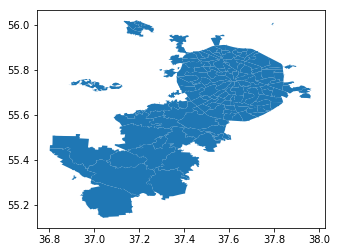

In [58]:
mo_gdf.plot()

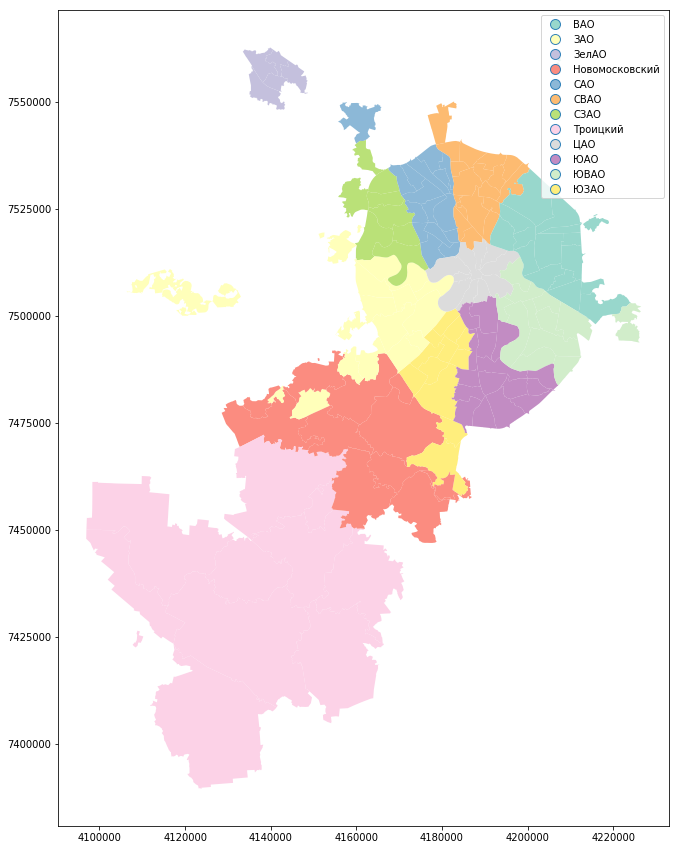

In [59]:
mo_gdf_wm = mo_gdf.to_crs({'init' :'epsg:3857'}) #непосредственно преобразование проекции
mo_gdf_wm.plot(column = 'ABBREV_AO', linewidth=0.5, cmap='Set3',alpha = 0.9, legend=True, figsize=[15,15])

### 4) We are only interested in Moscow

In [60]:
moscow = mo_gdf_wm[mo_gdf_wm["TYPE_MO"] == 'Муниципальный округ']

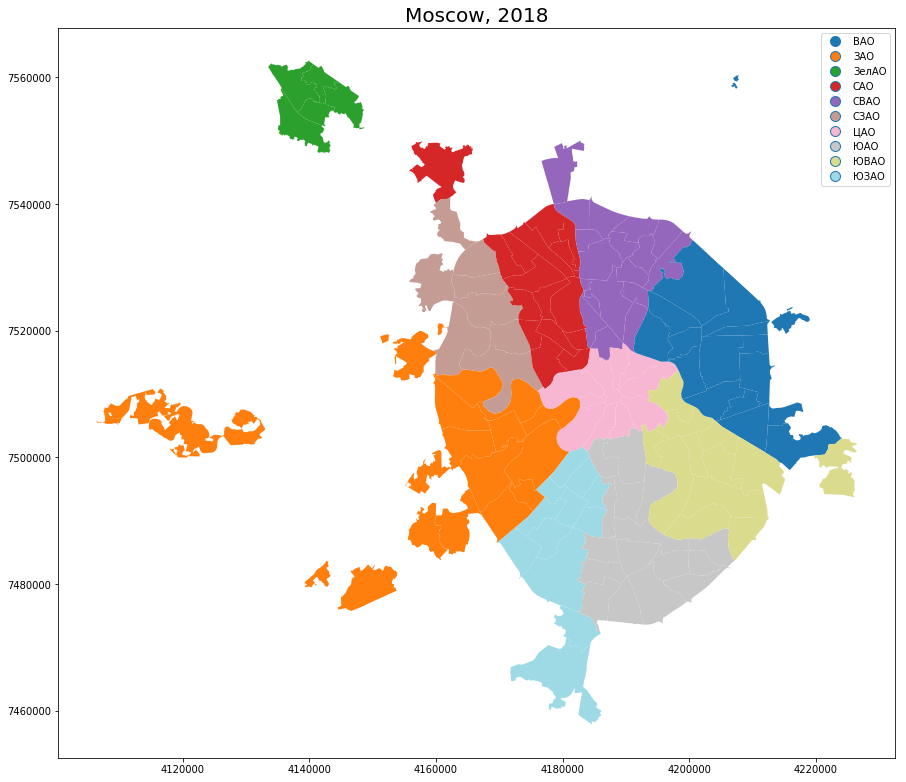

In [61]:
moscow.plot(column = 'ABBREV_AO', legend = True, linewidth=0, cmap='tab20', figsize=[15,15])
plt.title("Moscow, 2018", fontsize=20, y=0.95)
plt.show()

### 5) Diagram Voronoi

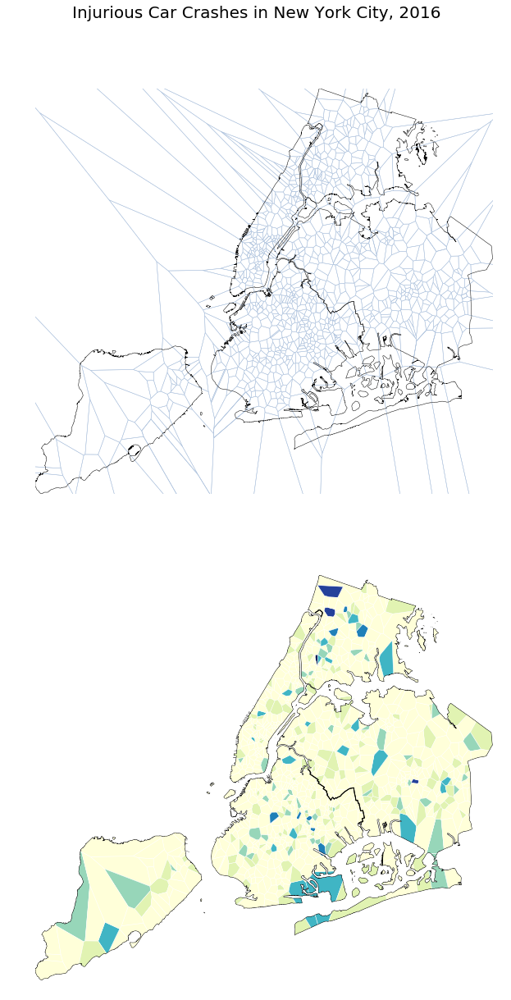

In [62]:
#Example

boroughs = gpd.read_file(geoplot_data.nyc_boroughs())
injurious_collisions = gpd.read_file(geoplot_data.nyc_injurious_collisions())

# A plot type using Voronoi tessellation: https://en.wikipedia.org/wiki/Voronoi_diagram

f, axarr = plt.subplots(2, 1, figsize=(10, 20))
gplt.voronoi(injurious_collisions.head(1000), edgecolor='lightsteelblue', linewidth=0.5, ax=axarr[0])
gplt.polyplot(boroughs, linewidth=0.5, ax=axarr[0])

gplt.voronoi(injurious_collisions.head(1000), hue='NUMBER OF PERSONS INJURED', cmap='YlGnBu',
             edgecolor='white', clip=boroughs.geometry,
             linewidth=0.5, categorical=True, ax=axarr[1])
gplt.polyplot(boroughs, linewidth=1, ax=axarr[1])

axarr[0].axis('off')
axarr[1].axis('off')


plt.suptitle("Injurious Car Crashes in New York City, 2016", fontsize=20, y=0.95)

plt.savefig("nyc-collisions-voronoi.png", bbox_inches='tight', pad_inches=0)

### 5.1) Analyzing data from an example (What is what?)

In [63]:
injurious_collisions.head()

,id,NUMBER OF PERSONS INJURED,BOROUGH,geometry
0,11,1,BROOKLYN,POINT (-73.94268479999999 40.676495)
1,21,1,MANHATTAN,POINT (-74.0083444 40.7213228)
2,27,1,BROOKLYN,POINT (-73.9707643 40.6876384)
3,28,1,BRONX,POINT (-73.83874250000002 40.8812664)
4,33,1,BROOKLYN,POINT (-73.98872990000002 40.5930014)


In [64]:
boroughs.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330385.03697,1.623853e+09,(POLYGON ((-74.05050806403247 40.5664220341608...
1,4,Queens,861038.47930,3.049947e+09,(POLYGON ((-73.83668274106708 40.5949466970158...
2,3,Brooklyn,726568.94634,1.959432e+09,(POLYGON ((-73.8670614947212 40.58208797679338...
3,1,Manhattan,358532.95642,6.364422e+08,(POLYGON ((-74.01092841268033 40.6844914725429...
4,2,Bronx,464517.89055,1.186804e+09,(POLYGON ((-73.89680883223775 40.7958084451597...


In [65]:
# Анализ данных метро Москвы (Что есть что?)

In [66]:
moscow.head()

,NAME,OKATO,OKTMO,NAME_AO,OKATO_AO,ABBREV_AO,TYPE_MO,geometry
1,Филёвский Парк,45268595,45328000,Западный,45268000,ЗАО,Муниципальный округ,"POLYGON ((4166426.928456915 7508453.649767973,..."
9,Матушкино,45272562,45331000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((4138694.961250751 7559998.797434154,..."
10,Внуково,45268552,45317000,Западный,45268000,ЗАО,Муниципальный округ,(POLYGON ((4144447.663104272 7476303.888757412...
11,Савёлки,45272568,45377000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((4142138.518378951 7558580.608673893,..."
13,Силино,45272572,45332000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((4133471.038110448 7561690.266458496,..."


In [67]:
with open("data/moscow_metro_full.txt") as file:
    for line in enumerate(file):
        print(line)

(0, '55.745113 37.864052 Новокосино\n')
(1, '55.752237 37.814587 Новогиреево\n')
(2, '55.75098 37.78422 Перово\n')
(3, '55.75809 37.751703 Шоссе Энтузиастов\n')
(4, '55.751933 37.717444 Авиамоторная\n')
(5, '55.747115 37.680726 Площадь Ильича\n')
(6, '55.740746 37.65604 Марксистская\n')
(7, '55.741125 37.626142 Третьяковская\n')
(8, '55.79233 37.55952 Петровский парк\n')
(9, '55.78643 37.53502 ЦСКА\n')
(10, '55.77643 37.51981 Хорошевская\n')
(11, '55.75723 37.52571 Шелепиха\n')
(12, '55.7491 37.5395 Деловой центр\n')
(13, '55.736478 37.514401 Парк Победы\n')
(14, '55.7232 37.5038 Минская\n')
(15, '55.7055 37.5225 Ломоносовский проспект\n')
(16, '55.6961 37.505 Раменки\n')
(17, '55.6888 37.485 Мичуринский проспект\n')
(18, '55.6698 37.4495 Озёрная\n')
(19, '55.6588 37.4174 Говорово \n')
(20, '55.649 37.3911 Солнцево\n')
(21, '55.647 37.3701 Боровское шоссе\n')
(22, '55.6385 37.3544 Новопеределкино\n')
(23, '55.6324 37.3328 Рассказовка\n')
(24, '55.8777 37.4877 Ховрино\n')
(25, '55.85415

### 5.2) Creating geopandas frame of Moscow metro stations

In [68]:
from geopandas import GeoSeries, GeoDataFrame
from shapely.geometry import Point

In [69]:
# table { id | Station | geometry (type Point) }
number_of_station = len(metro_list)        
df = pd.DataFrame(metro_list)
geometry = [Point(xy) for xy in zip(df['lng'], df['lat'])]
df.drop(['lng','lat'], inplace=True, axis=1)
gdf_station = GeoDataFrame(df, geometry=geometry)

In [70]:
df


,color_line,id_station,name_line,name_station,geometry
0,FFCD1C,8.189,Калининская,Новокосино,POINT (37.864052 55.745113)
1,FFCD1C,8.88,Калининская,Новогиреево,POINT (37.814587 55.752237)
2,FFCD1C,8.107,Калининская,Перово,POINT (37.78422 55.75098)
3,FFCD1C,8.158,Калининская,Шоссе Энтузиастов,POINT (37.751703 55.75809)
4,FFCD1C,8.1,Калининская,Авиамоторная,POINT (37.717444 55.751933)
5,FFCD1C,8.112,Калининская,Площадь Ильича,POINT (37.680726 55.747115)
6,FFCD1C,8.78,Калининская,Марксистская,POINT (37.65604 55.740746)
7,FFCD1C,8.91,Калининская,Третьяковская,POINT (37.626142 55.741125)
8,FFCD1C,8.594,Калининская,Петровский парк,POINT (37.55952 55.79233)
9,FFCD1C,8.592,Калининская,ЦСКА,POINT (37.53502 55.78643)


In [71]:
# Station
gdf_station.head(10)

,color_line,id_station,name_line,name_station,geometry
0,FFCD1C,8.189,Калининская,Новокосино,POINT (37.864052 55.745113)
1,FFCD1C,8.88,Калининская,Новогиреево,POINT (37.814587 55.752237)
2,FFCD1C,8.107,Калининская,Перово,POINT (37.78422 55.75098)
3,FFCD1C,8.158,Калининская,Шоссе Энтузиастов,POINT (37.751703 55.75809)
4,FFCD1C,8.1,Калининская,Авиамоторная,POINT (37.717444 55.751933)
5,FFCD1C,8.112,Калининская,Площадь Ильича,POINT (37.680726 55.747115)
6,FFCD1C,8.78,Калининская,Марксистская,POINT (37.65604 55.740746)
7,FFCD1C,8.91,Калининская,Третьяковская,POINT (37.626142 55.741125)
8,FFCD1C,8.594,Калининская,Петровский парк,POINT (37.55952 55.79233)
9,FFCD1C,8.592,Калининская,ЦСКА,POINT (37.53502 55.78643)


In [72]:
print(type(df))
print(type(gdf_station))
print(type(moscow))

<class 'pandas.core.frame.DataFrame'>
<class 'geopandas.geodataframe.GeoDataFrame'>
<class 'geopandas.geodataframe.GeoDataFrame'>


In [73]:
# Shape of Moscow
moscow.head()

,NAME,OKATO,OKTMO,NAME_AO,OKATO_AO,ABBREV_AO,TYPE_MO,geometry
1,Филёвский Парк,45268595,45328000,Западный,45268000,ЗАО,Муниципальный округ,"POLYGON ((4166426.928456915 7508453.649767973,..."
9,Матушкино,45272562,45331000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((4138694.961250751 7559998.797434154,..."
10,Внуково,45268552,45317000,Западный,45268000,ЗАО,Муниципальный округ,(POLYGON ((4144447.663104272 7476303.888757412...
11,Савёлки,45272568,45377000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((4142138.518378951 7558580.608673893,..."
13,Силино,45272572,45332000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((4133471.038110448 7561690.266458496,..."


In [74]:
def hex_to_rgb(hex):
    return tuple(int(hex[i:i+2], 16) for i in (0, 2 ,4))

In [75]:
hex_to_rgb("FFCD1C")

(255, 205, 28)

In [76]:
colors = list()
for color in gdf_station.sort_values(by=['name_line'])['color_line']:
    
    color_i = "#"+str(color)
    if color_i not in colors:
        colors.append(color_i)
colors

['#0072BA',
 '#88CDCF',
 '#BAC8E8',
 '#4FB04F',
 '#FFCD1C',
 '#F07E24',
 '#915133',
 '#BED12C',
 '#006DA8',
 '#F9BCD1',
 '#ADACAC',
 '#E42313',
 '#943E90',
 '#1EBCEF']

In [77]:
metro_cmap = ListedColormap((colors))

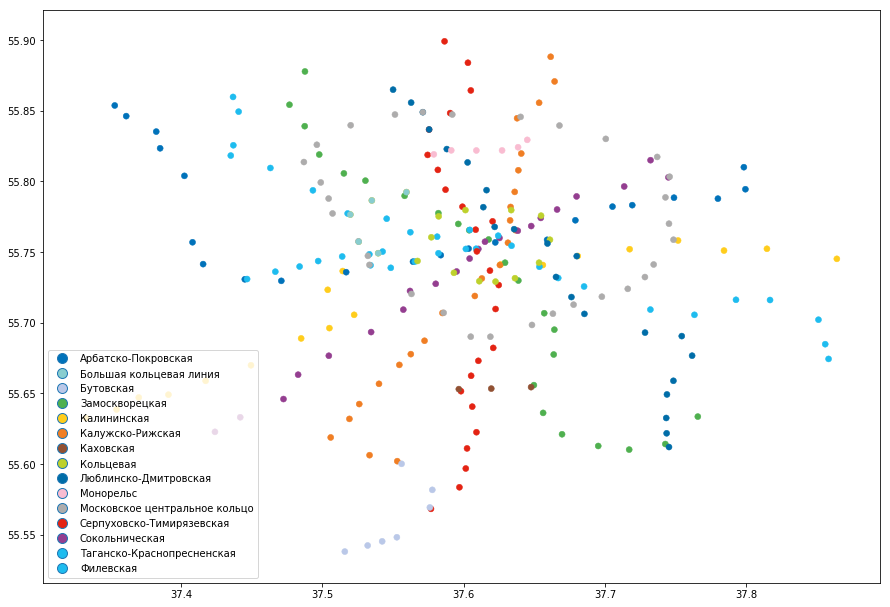

In [78]:
gdf_station.plot(column = 'name_line', linewidth=0.5, cmap=metro_cmap, alpha = 1, legend=True, figsize=[15,15])

In [79]:
moscow = mo_gdf[mo_gdf["TYPE_MO"] == 'Муниципальный округ']

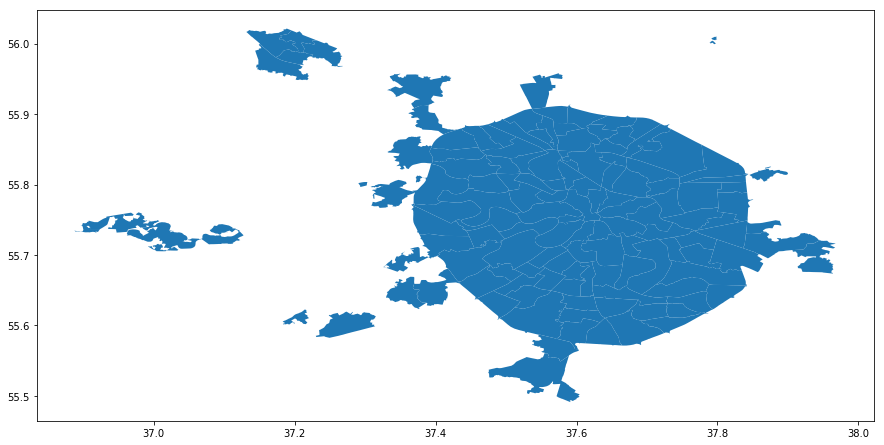

In [80]:
moscow.plot(figsize=[15,15])

/home/evgenii/.local/lib/python3.6/site-packages/geoplot/geoplot.py:2418: UserWarning: Generating a colormap using a categorical column with over 10 individual categories. This is not recommended!
  warnings.warn("Generating a colormap using a categorical column with over 10 individual categories. "


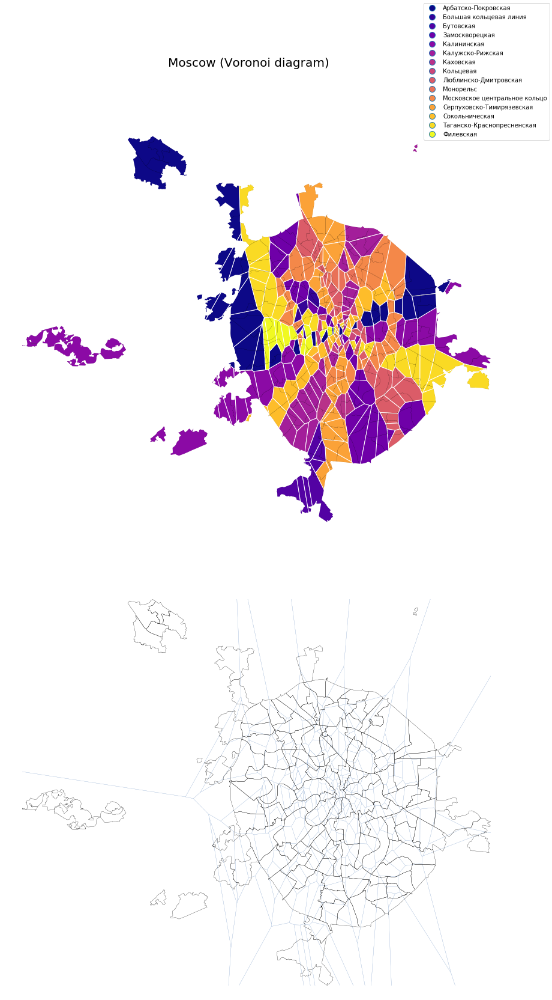

In [81]:
f, axarr = plt.subplots(2, 1, figsize=(14, 26))
#{'init' :'epsg:3857'},
gplt.voronoi(gdf_station, projection = False, hue='name_line', cmap='plasma',
             edgecolor='white', clip=moscow.geometry,
             linewidth=1, categorical=True, extent=(0,100,0,100), ax=axarr[0], legend=True)
gplt.polyplot(moscow, linewidth=0.1, ax=axarr[0])

gplt.voronoi(gdf_station, edgecolor='lightsteelblue', linewidth=0.3, ax=axarr[1])
gplt.polyplot(moscow, linewidth=0.3, ax=axarr[1])
axarr[0].axis('off')
axarr[1].axis('off')

plt.suptitle("Moscow (Voronoi diagram)", fontsize=20, y=0.95)
plt.savefig("moscow_voronoi.png", bbox_inches='tight', pad_inches=0)
plt.show()

### 5.3) Note additionally points - Moscow metro stations


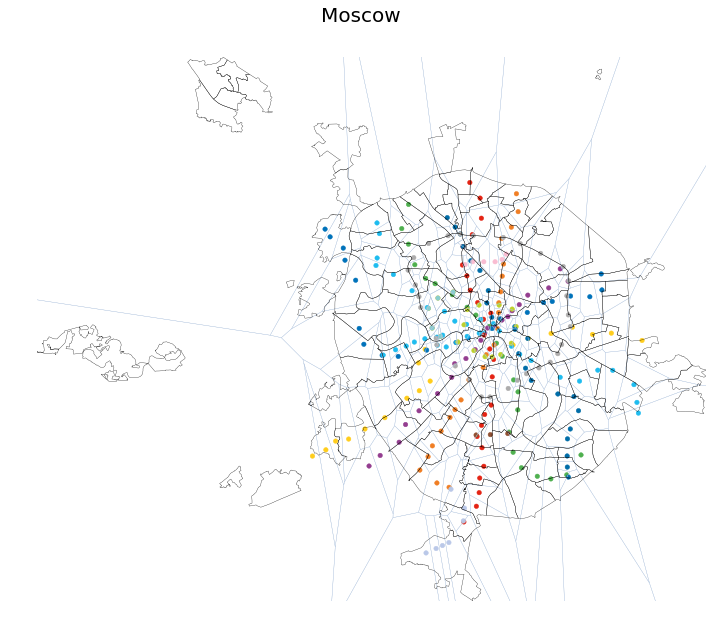

In [82]:
ax = gplt.voronoi(gdf_station, edgecolor='lightsteelblue', linewidth=0.3, figsize = (12,10))
gplt.polyplot(moscow, linewidth=0.3, ax=ax)
gplt.pointplot(gdf_station,hue='name_line', categorical=True,linewidth=0.5,  cmap = metro_cmap, ax = ax)
ax.axis('off')

plt.suptitle("Moscow", fontsize=20, y=0.95)
plt.show()

### 6) Create diagram voronoi and realize in powerful libraries
* __folium__
* __osmnx__
* __networkx__

https://github.com/gboeing/osmnx-examples/tree/master/notebooks

In [83]:
import folium
import networkx as nx
import osmnx as ox
import requests
from shapely.geometry import LineString
ox.config(use_cache=True, log_console=True)
ox.__version__

'0.8.2'

### 6.1) Information

#### Animation   
https://www.kaggle.com/poonaml/last-cab-to-new-york-animated-heatmap-trips-folium  
https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-analysis

### 6.2) osmnx  
https://github.com/gboeing/osmnx-examples/tree/master/notebooks

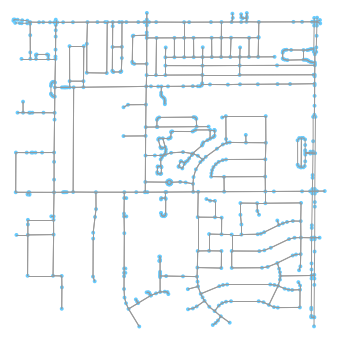

(<Figure size 513.091x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f87b4503160>)

In [118]:
location_point = (33.299896, -111.831638)
G = ox.graph_from_point(location_point, network_type='drive_service', distance=750, simplify=False)
ox.plot_graph(G)

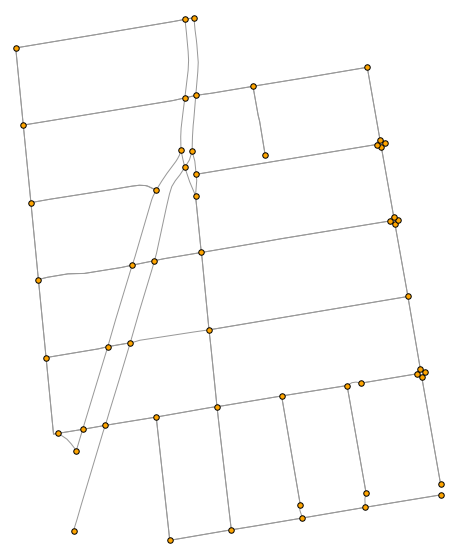

In [119]:
address = '2700 Shattuck Ave, Berkeley, CA'
G = ox.graph_from_address(address, network_type='drive', distance=350)
G_proj = ox.project_graph(G)
fig, ax = ox.plot_graph(G_proj, fig_height=10, node_color='orange', node_size=30, 
                        node_zorder=2, node_edgecolor='k')

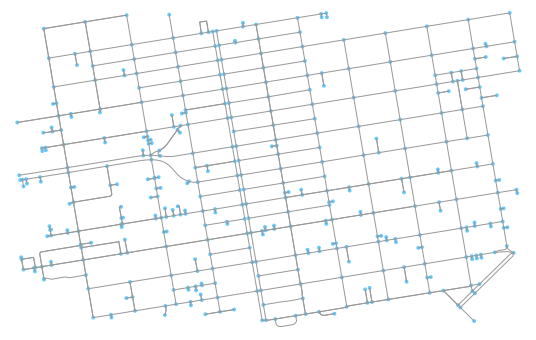

In [120]:
# define a bounding box in San Francisco
north, south, east, west = 37.79, 37.78, -122.41, -122.43

# create network from that bounding box
G1 = ox.graph_from_bbox(north, south, east, west, network_type='drive_service')
G1 = ox.project_graph(G1)
fig, ax = ox.plot_graph(G1)

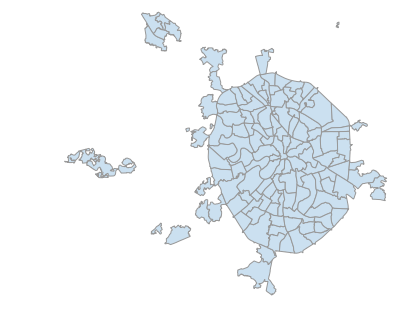

In [121]:
moscow_ox = ox.project_gdf(moscow)
fig, ax = ox.plot_shape(moscow_ox)

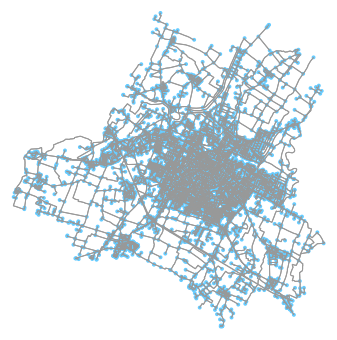

(<Figure size 602.109x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f87af6ae400>)

In [122]:
G = ox.graph_from_place('Modena, Italy')
ox.plot_graph(G)

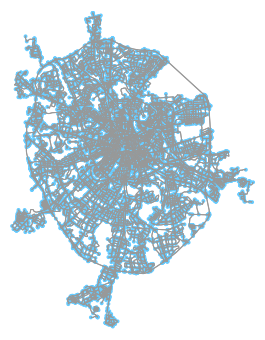

In [123]:
G_moscow = ox.graph_from_place('Moscow, Russia', network_type='drive')
fig, ax = ox.plot_graph(G_moscow)
fig.savefig("load_Moscow.png")

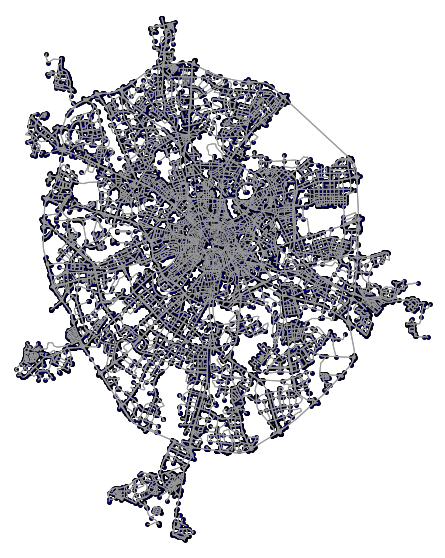

In [124]:
G_proj_moscow = ox.project_graph(G_moscow)
fig, ax = ox.plot_graph(G_proj_moscow, fig_height=10, node_color='navy', node_edgecolor='k')

In [ ]:
#edge closeness centrality: convert graph to line graph so edges become nodes and vice versa
edge_centrality = nx.closeness_centrality(nx.line_graph(G_moscow))

# list of edge values for the orginal graph
ev = [edge_centrality[edge + (0,)] for edge in G.edges()]

In [ ]:
f = open('data/moscow_metro_edge_centrality.txt', 'w')
for i in edge_centrality:
    f.write(str(i)+' ')
f.close()

In [ ]:
f = open('data/moscow_metro_ev.txt', 'w')
for i in ev:
    f.write(str(i)+' ')
f.close()

In [ ]:
# color scale converted to list of colors for graph edges
norm = colors.Normalize(vmin=min(ev)*0.8, vmax=max(ev))
cmap = cm.ScalarMappable(norm=norm, cmap=cm.inferno)
ec = [cmap.to_rgba(cl) for cl in ev]

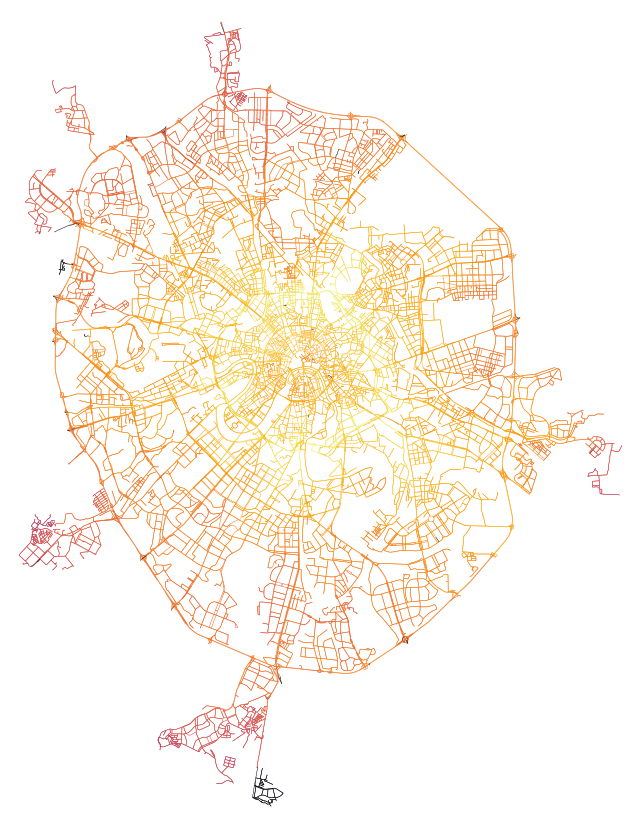

In [78]:
# color the edges in the original graph with closeness centralities in the line graph
fig, ax = ox.plot_graph(G_moscow, axis_off=True,fig_height = 15, node_size=0,
                        edge_color=ec, edge_linewidth=0.5, edge_alpha=1)

```
For example, find the shortest distance between:
- 1) Moscow State University, Faculty of Physics 2) ul. Borovskoye Highway, vl2, k3 / 1
- 1) Moscow State University, Faculty of Physics 3) ul. Academician Volgin, 3
```

In [ ]:
#1) 55.700234, 37.529154
point_one = (55.700234, 37.529154)
#2) 55.661450, 37.415736
point_two = (55.661450, 37.415736)
#3) 55.653951, 37.521491
point_three = (55.653951, 37.521491)

In [45]:
#point format like (55.789274,37.748753)
def calculate_distance(point_1, point_2, G,nodes_proj,edges_proj):
    orig_node = ox.utils.get_nearest_node(G, point_1)
    dest_node = ox.utils.get_nearest_node(G, point_2)
    route = nx.shortest_path(G, orig_node, dest_node, weight='length')
#     print('Starting {}'.format(point_1))
#     print('Ending {}'.format(point_2))
    route_nodes = nodes_proj.loc[route]
    coordinates = list(zip(route_nodes['x'], route_nodes['y']))
    route_line = LineString(list(route_nodes.geometry.values))
#     print(coordinates)
    route_geom = gpd.GeoDataFrame(crs=edges_proj.crs)
    route_geom['geometry'] = None
    route_geom['osmids'] = None
    route_geom.loc[0, 'geometry'] = route_line
    route_geom.loc[0, 'osmids'] = str(list(route_nodes['osmid'].values))  
    
    return ((route_geom.length * 10e4) [0]),coordinates

In [ ]:
GRAPH_zone_prm = ox.graph_from_place('Moscow, Russia', network_type='drive')
fig, ax = ox.plot_graph(GRAPH_zone_prm,fig_height = 15, node_size=0)
nodes_proj, edges_proj = ox.graph_to_gdfs(GRAPH_zone_prm, nodes=True, edges=True)

In [ ]:
distance_one = calculate_distance(point_one,point_two,GRAPH_zone_prm, nodes_proj, edges_proj)
distance_one[0]

In [ ]:
distance_two = calculate_distance(point_one,point_three,GRAPH_zone_prm, nodes_proj, edges_proj)
distance_two[0]

In [ ]:
G_moscow = ox.graph_from_place('Moscow, Russia', network_type='drive')

In [ ]:
def plot_route(G, origin_point, destination_point):
    origin = origin_point
    destination = destination_point
    origin_node = ox.get_nearest_node(G, origin)
    destination_node = ox.get_nearest_node(G, destination)
    route_one = nx.shortest_path(G, origin_node, destination_node)
    fig, ax = ox.plot_graph_route(G, route_one,  axis_off=True,fig_height = 15, 
                              node_size=0, edge_linewidth=0.5, edge_alpha=1, origin_point=origin_point,
                              destination_point=destination_point, save=True, filename='route')

In [ ]:
plot_route(G_moscow, point_one, point_two)

In [ ]:
plot_route(G_moscow, point_one, point_three)

In [ ]:
north, south, east, west = 55.73, 55.64, 37.59, 37.4
# create network from that bounding box
G_moscow_bounds = ox.graph_from_bbox(north, south, east, west, network_type='drive_service')

In [ ]:
G1 = ox.project_graph(G_moscow_bounds)
fig, ax = ox.plot_graph(G1, fig_height = 15)

In [ ]:
plot_route(G_moscow_bounds, point_one, point_two)

In [ ]:
plot_route(G_moscow_bounds, point_one, point_three)

In [3]:
ec = ox.get_edge_colors_by_attr(G_moscow, attr='length')

In [ ]:
#gdfs_moscow = ox.save_load.graph_to_gdfs(G_moscow,nodes=False, fill_edge_geometry=True)
#gdfs_moscow['edge_color'] = ec

In [10]:
#make_folium_polyline(edge, edge_width, edge_opacity, popup_attribute=None)
#graph_map_moscow = ox.plot.plot_graph_folium(G_moscow,edge_color=ec, graph_map=None, zoom=10, fit_bounds=True, edge_width=2, edge_opacity=1)

In [84]:
mo_gdf = gpd.read_file('maps_data/mo.shp')
lats = list()
longs = list()
name_station = list()
colors_station = ['#' + station['color_line'] for station in metro_list]
with open("data/moscow_metro_full.txt") as file:
    for line in file:
        x, y, name = line.split(maxsplit=2)
        lats.append(float(x))
        longs.append(float(y))
        name_station.append(name)

In [85]:
colors = ['aqua', 'blue', 'fuchsia', 'green', 'maroon', 'orange', 'red','yellow', 'violet', 'indigo', 'chartreuse', 'lime']
colors2 = ['#%02X%02X%02X' % (int(255*R), int(255*G), int(255*B)) for (R, G, B) in  list(plt.get_cmap('Set3').colors)]
color_list = list(range(mo_gdf.shape[0]))
for j, name_ao in enumerate(set(mo_gdf['NAME_AO'].values)):
    for i in range(mo_gdf.shape[0]):
        if  mo_gdf.loc[i]['NAME_AO'] == name_ao:
                color_list[i] = {'fillColor': colors[j], 'weight': 2, 'color': '#084DAF'}
mo_gdf['style'] = color_list

In [86]:
import random
color_list = list(range(mo_gdf.shape[0]))
r = lambda: random.randint(0,255)
for name_ao in set(mo_gdf['NAME_AO'].values):
    R, G, B = r(), r(), r()
    for i in range(mo_gdf.shape[0]):
        if  mo_gdf.loc[i]['NAME_AO'] == name_ao:
            color_list[i] = {'fillColor': '#%02X%02X%02X' % (R, G, B), 'weight': 2, 'color': '#084DAF'}
mo_gdf['style'] = color_list

In [87]:
mo_gdf.head()

,NAME,OKATO,OKTMO,NAME_AO,OKATO_AO,ABBREV_AO,TYPE_MO,geometry,style
0,Киевский,45298555,45945000,Троицкий,45298000,Троицкий,Поселение,"(POLYGON ((36.8031012 55.4408329, 36.8031903 5...","{'fillColor': '#C48816', 'weight': 2, 'color':..."
1,Филёвский Парк,45268595,45328000,Западный,45268000,ЗАО,Муниципальный округ,"POLYGON ((37.4276499 55.7482092, 37.4284863 55...","{'fillColor': '#AA1139', 'weight': 2, 'color':..."
2,Новофёдоровское,45298567,45954000,Троицкий,45298000,Троицкий,Поселение,"POLYGON ((36.8035692 55.4516224, 36.8045117 55...","{'fillColor': '#C48816', 'weight': 2, 'color':..."
3,Роговское,45298575,45956000,Троицкий,45298000,Троицкий,Поселение,"POLYGON ((36.9372397 55.2413907, 36.9372604 55...","{'fillColor': '#C48816', 'weight': 2, 'color':..."
4,"""Мосрентген""",45297568,45953000,Новомосковский,45297000,Новомосковский,Поселение,"POLYGON ((37.4395575 55.6273129, 37.4401803 55...","{'fillColor': '#936F93', 'weight': 2, 'color':..."


In [91]:
places=[([x[0],x[1]]) for x in zip(lats,longs)]

maps_version = {0:'openstreetmap',
                #1:'mapquestopen',
                2:'Stamen Terrain',
                #3:'MapQuest Open Aerial',
                4:'MapBox Bright',
                5:'Mapbox Control Room',
                6:'stamentoner',
                7:'stamenwatercolor',
                8:'cartodbpositron',
                9:'cartodbdark_matter'}

API = 'docvaughan.iia856df'
mapa = maps_version[0]
m = folium.Map(places[100], tiles = mapa, zoom_start=11)

#county_geo = os.path.join('russia.json')
#region_data = pd.read_csv('graf/russia_region_names.tsv')
#points = folium.features.GeoJson(moscow_json)

#folium.features.GeoJson(moscow_json)

folium.GeoJson(mo_gdf).add_to(m)

plugins.HeatMap(places,radius=20,overlay=False, max_val=50).add_to(m)
plugins.MarkerCluster(places).add_to(m)
for point, name, color in zip(places, name_station, colors_station):
    folium.CircleMarker(location= point , radius = 6, color = color, fill=True,
      fill_color=color, fill_opacity = 0.7, popup=name).add_to(m)
#folium.PolyLine(locations=[places[0], places[1]], color='pink').add_to(m)


# save as html file then display map as an iframe
filepath = 'data/'+mapa+'_moscow.html'
m.save(filepath)
m

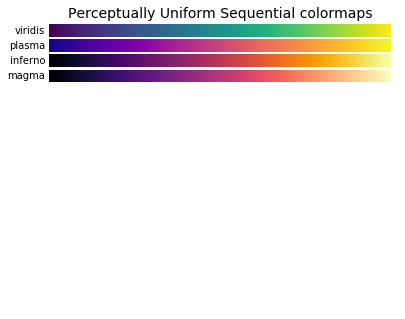

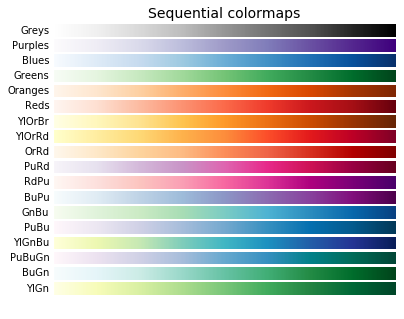

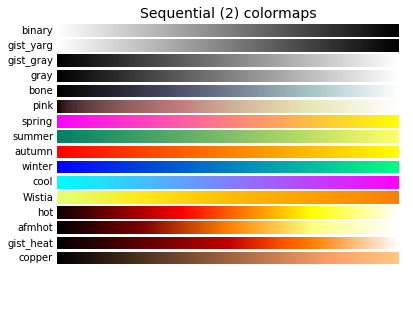

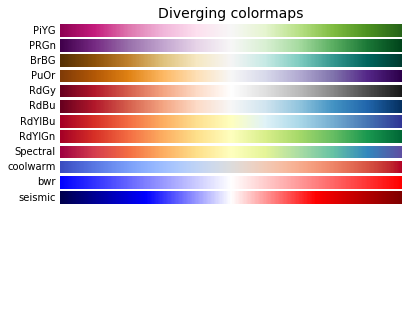

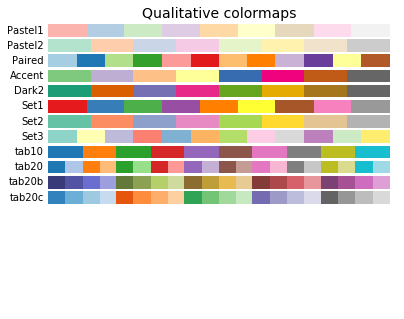

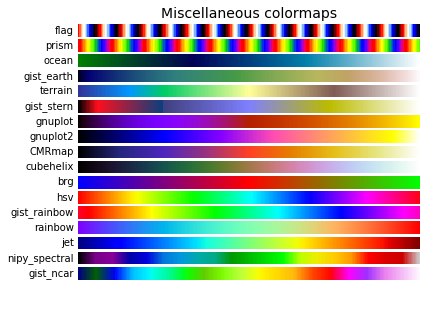

In [92]:
import numpy as np
import matplotlib.pyplot as plt


# Have colormaps separated into categories:
# http://matplotlib.org/examples/color/colormaps_reference.html
cmaps = [('Perceptually Uniform Sequential', [
            'viridis', 'plasma', 'inferno', 'magma']),
         ('Sequential', [
            'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
            'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
            'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']),
         ('Sequential (2)', [
            'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink',
            'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia',
            'hot', 'afmhot', 'gist_heat', 'copper']),
         ('Diverging', [
            'PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu',
            'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic']),
         ('Qualitative', [
            'Pastel1', 'Pastel2', 'Paired', 'Accent',
            'Dark2', 'Set1', 'Set2', 'Set3',
            'tab10', 'tab20', 'tab20b', 'tab20c']),
         ('Miscellaneous', [
            'flag', 'prism', 'ocean', 'gist_earth', 'terrain', 'gist_stern',
            'gnuplot', 'gnuplot2', 'CMRmap', 'cubehelix', 'brg', 'hsv',
            'gist_rainbow', 'rainbow', 'jet', 'nipy_spectral', 'gist_ncar'])]


nrows = max(len(cmap_list) for cmap_category, cmap_list in cmaps)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))


def plot_color_gradients(cmap_category, cmap_list, nrows):
    fig, axes = plt.subplots(nrows=nrows)
    fig.subplots_adjust(top=0.95, bottom=0.01, left=0.2, right=0.99)
    axes[0].set_title(cmap_category + ' colormaps', fontsize=14)

    for ax, name in zip(axes, cmap_list):
        ax.imshow(gradient, aspect='auto', cmap=plt.get_cmap(name))
        pos = list(ax.get_position().bounds)
        x_text = pos[0] - 0.01
        y_text = pos[1] + pos[3]/2.
        fig.text(x_text, y_text, name, va='center', ha='right', fontsize=10)

    # Turn off *all* ticks & spines, not just the ones with colormaps.
    for ax in axes:
        ax.set_axis_off()


for cmap_category, cmap_list in cmaps:
    plot_color_gradients(cmap_category, cmap_list, nrows)

plt.show()

### 6.3) Finally, create an algorithm, the Voronoi diagram

### 6.3.1 pytess

[5602494.02157105 2277170.49236692]


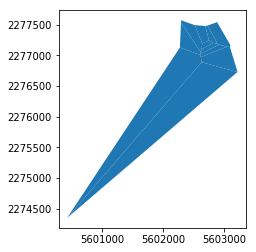

In [93]:
import geopandas as gp
import numpy as np
import pytess
from shapely.geometry import Point, LineString, Polygon

list_centroids = [[5602414.710853475, 2276953.868022472], [5602811.942643783, 2277014.42599593], [5602786.520959574, 2277078.203081659], [5602757.831566737, 2277135.13165023], [5602726.400724698, 2277190.140619183], [5602494.021571051, 2277170.492366924], [5602550.460524382, 2277207.810717136], [5602690.650712324, 2277265.214973784], [5602788.200198333, 2277290.096373509], [5602855.037044225, 2277326.977219126], [5603079.663762391, 2277456.471662892]]

points = np.array(list_centroids)

voronoipolys = pytess.voronoi(points)
print(voronoipolys[3][0])
poligons = [Polygon(voronoipolys[i][1]) for i in range(len(points))]

poly_df = gp.GeoDataFrame(geometry=poligons)
poly_df.plot()

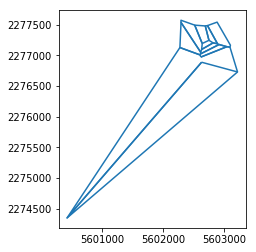

In [94]:
#points  = [Point(voronoipolys[i][0]) for i in (range(len(points)))]
                                               
lines = [LineString(voronoipolys[i][1])for i in (range(len(points)))]


lines_df = gp.GeoDataFrame(geometry=lines)
lines_df.plot()

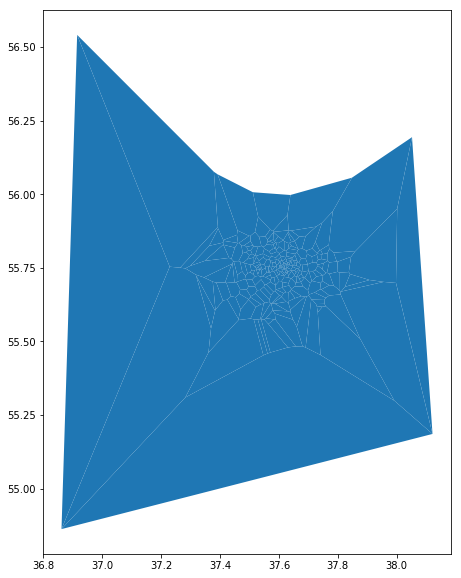

In [95]:
places_point=[[x[1],x[0]] for x in zip(lats,longs)]
points = np.array(places_point)
voronoipolys = pytess.voronoi(points)
poligons = []
for i in range(260):
    poligons.append(Polygon(voronoipolys[i][1]))

poly_df = gp.GeoDataFrame(geometry=poligons)
poly_df.plot(figsize=(10,10))

### 6.3.2 scipy.spatial.Voronoi

https://stackoverflow.com/questions/27548363/from-voronoi-tessellation-to-shapely-polygons/27703081#27703081

In [96]:
import numpy as np
from scipy.spatial import Voronoi, voronoi_plot_2d, SphericalVoronoi
import shapely.geometry
import shapely.ops

points = np.random.random((10, 2))
print(points)

[[0.76416707 0.5726345 ]
 [0.13130163 0.15168575]
 [0.86627912 0.31028855]
 [0.19954579 0.11669797]
 [0.49059764 0.03518679]
 [0.33727677 0.21851999]
 [0.89918044 0.27518405]
 [0.4945386  0.71243939]
 [0.11856038 0.69567963]
 [0.01605804 0.52171673]]


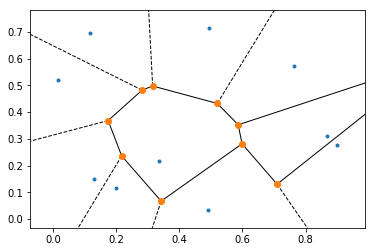

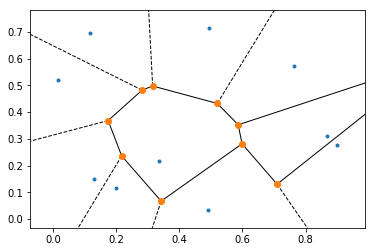

In [97]:
vor = Voronoi(points, furthest_site=False)
voronoi_plot_2d(vor)

In [98]:
vor.regions

[[2, -1, 0],
 [2, -1, 1],
 [4, -1, 3],
 [3, 1, -1],
 [-1, 4, 5],
 [],
 [9, 7, 6, 8],
 [7, 5, -1, 6],
 [8, -1, 6],
 [9, 0, 2, 1, 3, 4, 5, 7],
 [9, 0, -1, 8]]

In [99]:
lines = [
    shapely.geometry.LineString(vor.vertices[line])
    for line in vor.ridge_vertices
    if -1 not in line
]

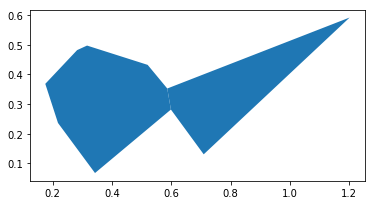

In [100]:
import numpy as np
import matplotlib
from matplotlib.patches import Circle, Wedge, Polygon
from matplotlib.collections import PatchCollection
import matplotlib.pyplot as plt


# Fixing random state for reproducibility
patches = []

for poly in shapely.ops.polygonize(lines):
    patches.append(poly)

gp.GeoDataFrame(geometry=patches).plot()

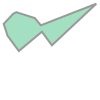

In [101]:
pol_one = shapely.ops.unary_union(list(shapely.ops.polygonize(lines)))
pol_one

In [102]:
places_point=[[x[0],x[1]] for x in zip(lats,longs)]

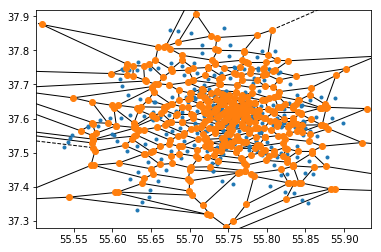

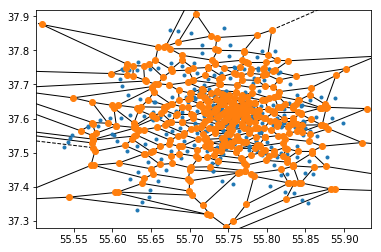

In [103]:
vor_m = Voronoi(places_point)
voronoi_plot_2d(vor_m)

In [104]:
lines_m = [
    shapely.geometry.LineString(vor_m.vertices[line])
    for line in vor_m.ridge_vertices
    if -1 not in line
]

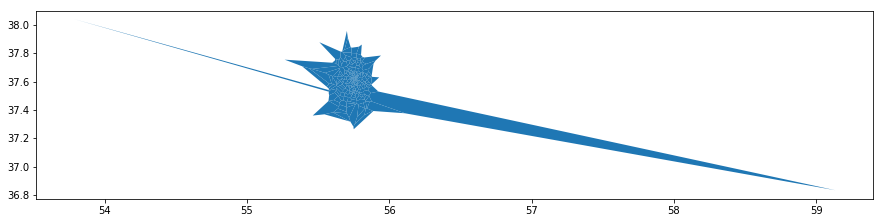

In [105]:
patches_m = []

for poly in shapely.ops.polygonize(lines_m):
    patches_m.append(poly)

gp.GeoDataFrame(geometry=patches_m).plot(figsize=(15, 15))

In [106]:
pol_one_m = shapely.ops.unary_union(list(shapely.ops.polygonize(lines_m)))

### 6.3.3 Voronoi for maps

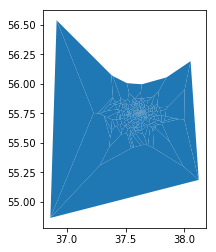

In [107]:
poly_df.plot()

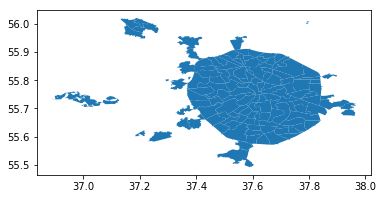

In [108]:
moscow_shape = mo_gdf[mo_gdf_wm["TYPE_MO"] == 'Муниципальный округ']
moscow_shape.plot()

In [109]:
#from geopandas.tools import overlay
#newdf = overlay(moscow_shape,moscow_shape, how="union")

In [110]:
#newdf.plot()

In [111]:
newdf = shapely.ops.unary_union(moscow_shape.geometry)


In [112]:
moscow_shape.head()

,NAME,OKATO,OKTMO,NAME_AO,OKATO_AO,ABBREV_AO,TYPE_MO,geometry,style
1,Филёвский Парк,45268595,45328000,Западный,45268000,ЗАО,Муниципальный округ,"POLYGON ((37.4276499 55.7482092, 37.4284863 55...","{'fillColor': '#AA1139', 'weight': 2, 'color':..."
9,Матушкино,45272562,45331000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((37.1785294 56.0079518, 37.1808275 56...","{'fillColor': '#74E83D', 'weight': 2, 'color':..."
10,Внуково,45268552,45317000,Западный,45268000,ЗАО,Муниципальный округ,"(POLYGON ((37.2302068 55.5853213, 37.2353733 5...","{'fillColor': '#AA1139', 'weight': 2, 'color':..."
11,Савёлки,45272568,45377000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((37.2094634 56.0008286, 37.2097536 56...","{'fillColor': '#74E83D', 'weight': 2, 'color':..."
13,Силино,45272572,45332000,Зеленоградский,45272000,ЗелАО,Муниципальный округ,"POLYGON ((37.1316021 56.0164459, 37.1326592 56...","{'fillColor': '#74E83D', 'weight': 2, 'color':..."


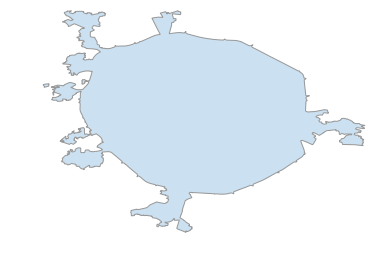

In [113]:
mm = ox.gdf_from_places(['Moscow, Russia'])
fig, ax = ox.plot_shape(mm)

In [114]:
type(mm)

geopandas.geodataframe.GeoDataFrame

In [115]:
mm

,bbox_east,bbox_north,bbox_south,bbox_west,geometry,place_name
0,37.967428,55.95741,55.491308,37.290502,"(POLYGON ((37.290502 55.8019897, 37.2932645 55...","Moscow, Central Administrative Okrug, Moscow, ..."


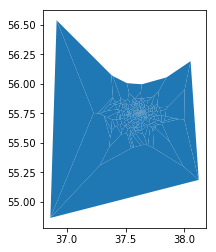

In [116]:
poly_df.plot()

In [117]:
type(poly_df)

geopandas.geodataframe.GeoDataFrame

In [118]:
newdf = gp.overlay(mm,poly_df, how="identity")

/home/evgenii/.local/lib/python3.6/site-packages/geopandas/base.py:29: UserWarning: GeoSeries crs mismatch: {'init': 'epsg:4326'} and None
  other.crs))


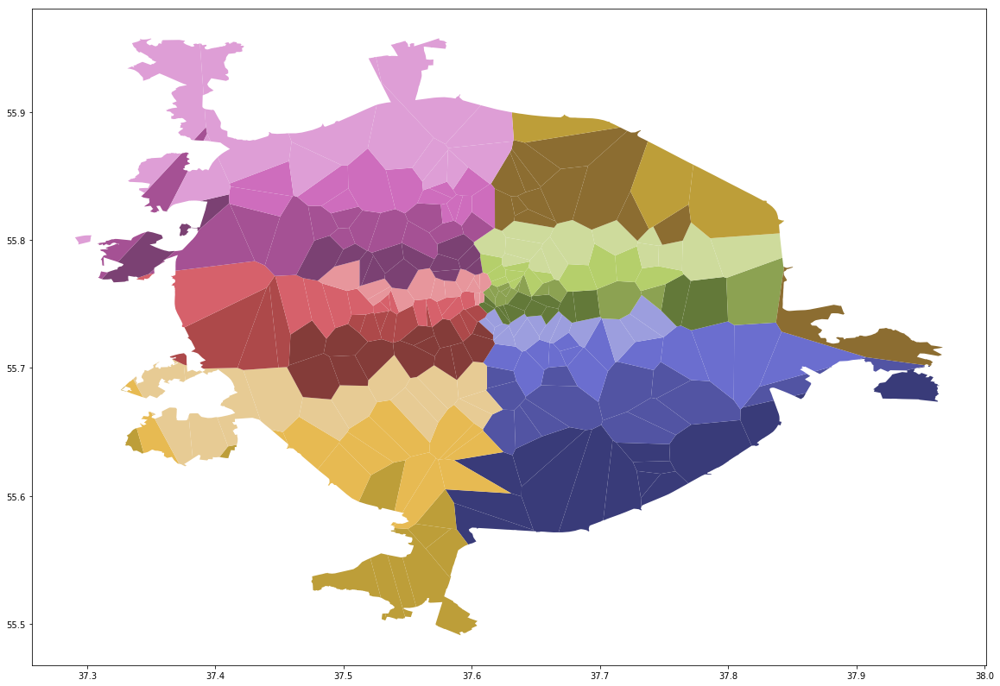

In [119]:
newdf.plot(cmap='tab20b', figsize = (25,14))

In [120]:
places=[([x[0],x[1]]) for x in zip(lats,longs)]

maps_version = {0:'openstreetmap',
                #1:'mapquestopen',
                2:'Stamen Terrain',
                #3:'MapQuest Open Aerial',
                4:'MapBox Bright',
                5:'Mapbox Control Room',
                6:'stamentoner',
                7:'stamenwatercolor',
                8:'cartodbpositron',
                9:'cartodbdark_matter'}

API = 'docvaughan.iia856df'
mapa = maps_version[7]
m = folium.Map(places[100], tiles = mapa, zoom_start=11)

folium.GeoJson(newdf).add_to(m)

plugins.HeatMap(places,radius=20,overlay=False, max_val=50).add_to(m)
plugins.MarkerCluster(places).add_to(m)
for point, name, color in zip(places, name_station, colors_station):
    folium.CircleMarker(location= point , radius = 6, color = color, fill=True,
      fill_color=color, fill_opacity = 0.7, popup=name).add_to(m)
#folium.PolyLine(locations=[places[0], places[1]], color='pink').add_to(m)


# save as html file then display map as an iframe
filepath = 'data/'+mapa+'_demo_moscow.html'
m.save(filepath)
m

### 6.3.4 Add color and highlight_function

In [121]:
import random

r = lambda: random.randint(0,255)
for i in range(newdf.shape[0]):
    R, G, B = r(), r(), r()
    newdf.loc[i,'style'] = [{'fillColor': '#%02X%02X%02X' % (R, G, B), 'weight': 2, 'color': '#084DAF'}]

In [122]:
mapa = maps_version[0]
m = folium.Map(places[100], tiles = mapa, zoom_start=11)

#county_geo = os.path.join('russia.json')
#region_data = pd.read_csv('graf/russia_region_names.tsv')
#points = folium.features.GeoJson(moscow_json)

#folium.features.GeoJson(moscow_json)
# highlight_function=lambda feature: {'fillOpacity' : 0.1, 'weight' : 3.5}
folium.GeoJson(newdf, highlight_function=lambda feature: {'weight' : 4}).add_to(m)

plugins.HeatMap(places,radius=20,overlay=False, max_val=50).add_to(m)
plugins.MarkerCluster(places).add_to(m)
for point, name, color in zip(places, name_station, colors_station):
    folium.CircleMarker(location= point , radius = 6, color = color, fill=True,
      fill_color=color, fill_opacity = 0.7, popup=name).add_to(m)
#folium.PolyLine(locations=[places[0], places[1]], color='pink').add_to(m)
#folium.Popup
folium.Polygon
# save as html file then display map as an iframe
filepath = 'data/'+mapa+'_color_demo_moscow.html'
m.save(filepath)
m

### 6.3.5 Give names for any polygon

In [123]:
json_df_voronoi = json.loads(newdf.to_json())

In [124]:
mapa = maps_version[0]
m = folium.Map(places[100], tiles = mapa, zoom_start=11)
folium.GeoJson(newdf).add_to(m)

for n_area in range(newdf.shape[0]):
    R, G, B = r(), r(), r()
    gj = folium.GeoJson(
        data={
            'type': json_df_voronoi['features'][n_area]['geometry']['type'],
            'coordinates': json_df_voronoi['features'][n_area]['geometry']['coordinates']
        },
        style_function = lambda feature: json_df_voronoi['features'][n_area]['properties']['style'],
        highlight_function=lambda feature: {'fillColor': 'blue', 'weight' : 4})
    gj.add_child(folium.Popup('Metro_'+str(n_area)))
    gj.add_to(m)
plugins.HeatMap(places,radius=20,overlay=False, max_val=50).add_to(m)
plugins.MarkerCluster(places).add_to(m)

for point, name, color in zip(places, name_station, colors_station):
    folium.CircleMarker(location= point , radius = 6, color = color, fill=True,
      fill_color=color, fill_opacity = 0.7, popup=name).add_to(m)

# save as html file then display map as an iframe
filepath = 'data/'+mapa+'_pro_color_demo_moscow.html'
m.save(filepath)
m

### 6.3.6 Try give correct name

In [125]:
newdf.head()

,bbox_east,bbox_north,bbox_south,bbox_west,place_name,geometry,style
0,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.94701085501507 55.69995013244297...,"{'fillColor': '#C9B6B6', 'weight': 2, 'color':..."
1,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.76897706879326 55.60993592679001...,"{'fillColor': '#DA288F', 'weight': 2, 'color':..."
2,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.64864094513517 55.57253872070125,...","{'fillColor': '#70F2C2', 'weight': 2, 'color':..."
3,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.73243159869627 55.59181777634956,...","{'fillColor': '#A666D8', 'weight': 2, 'color':..."
4,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.70261138487841 55.5810241116383, ...","{'fillColor': '#205402', 'weight': 2, 'color':..."


In [126]:
gdf_station.head()

,color_line,id_station,name_line,name_station,geometry
0,FFCD1C,8.189,Калининская,Новокосино,POINT (37.864052 55.745113)
1,FFCD1C,8.88,Калининская,Новогиреево,POINT (37.814587 55.752237)
2,FFCD1C,8.107,Калининская,Перово,POINT (37.78422 55.75098)
3,FFCD1C,8.158,Калининская,Шоссе Энтузиастов,POINT (37.751703 55.75809)
4,FFCD1C,8.1,Калининская,Авиамоторная,POINT (37.717444 55.751933)


In [127]:
n=0
for i in range(newdf.shape[0]):
    for j in range(gdf_station.shape[0]):
        polygon = newdf.loc[i, 'geometry']
        point = gdf_station.loc[j,'geometry']
        if polygon.contains(point):
            n+=1

In [128]:
print(n)
print(gdf_station.shape[0])
print(newdf.shape[0])

257
263
258


```
It happened just because, they really do not fall into the objects, so rather we’ll do it manually for them.
```

### 6.3.7 Add three column "name_line", 'name_station', 'color_line'

In [129]:
from tqdm import tqdm
from itertools import product

In [130]:
parameters_list = list(product(list(range(newdf.shape[0])), list(range(gdf_station.shape[0]))))

In [131]:
%%time
newdf['name_line'] = ["False" for i in range(newdf.shape[0])]
for i in tqdm(parameters_list, total = len(parameters_list)):
    polygon = newdf.loc[i[0], 'geometry']
    point = gdf_station.loc[i[1],'geometry']
    if polygon.contains(point):
        newdf.loc[i[0], 'name_line'] = gdf_station.loc[i[1], 'name_line']
        newdf.loc[i[0], 'name_station'] = gdf_station.loc[i[1], 'name_station']
        newdf.loc[i[0], 'color_line'] = gdf_station.loc[i[1], 'color_line']

100%|██████████| 67854/67854 [00:01<00:00, 45610.85it/s]

CPU times: user 1.5 s, sys: 4.03 ms, total: 1.5 s
Wall time: 1.49 s


In [132]:
newdf.head()

,bbox_east,bbox_north,bbox_south,bbox_west,place_name,geometry,style,name_line,name_station,color_line
0,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.94701085501507 55.69995013244297...,"{'fillColor': '#C9B6B6', 'weight': 2, 'color':...",False,NaN,NaN
1,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.76897706879326 55.60993592679001...,"{'fillColor': '#DA288F', 'weight': 2, 'color':...",Люблинско-Дмитровская,Зябликово,BED12C
2,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.64864094513517 55.57253872070125,...","{'fillColor': '#70F2C2', 'weight': 2, 'color':...",Серпуховско-Тимирязевская,Аннино,ADACAC
3,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.73243159869627 55.59181777634956,...","{'fillColor': '#A666D8', 'weight': 2, 'color':...",Замоскворецкая,Домодедовская,4FB04F
4,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.70261138487841 55.5810241116383, ...","{'fillColor': '#205402', 'weight': 2, 'color':...",Замоскворецкая,Орехово,4FB04F


In [133]:
### 7 lost - for example
gdf_station[gdf_station['name_station'] == 'Котельники']

,color_line,id_station,name_line,name_station,geometry
175,943E90,7.508,Таганско-Краснопресненская,Котельники,POINT (37.8582 55.6743)


In [134]:
newdf[newdf['name_line'] == "False"]

,bbox_east,bbox_north,bbox_south,bbox_west,place_name,geometry,style,name_line,name_station,color_line
0,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.94701085501507 55.69995013244297...,"{'fillColor': '#C9B6B6', 'weight': 2, 'color':...",False,NaN,NaN
119,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.34413624475387 55.63355116611739...,"{'fillColor': '#8C754F', 'weight': 2, 'color':...",False,NaN,NaN
125,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.41674350753024 55.64002665234626,...","{'fillColor': '#E1CAEF', 'weight': 2, 'color':...",False,NaN,NaN
132,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.45807272187197 55.63737982253625...,"{'fillColor': '#A68B2B', 'weight': 2, 'color':...",False,NaN,NaN
147,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.43540628723753 55.65859119815236,...","{'fillColor': '#D16BFF', 'weight': 2, 'color':...",False,NaN,NaN
218,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.38638149658909 55.80704174029331...,"{'fillColor': '#E469CE', 'weight': 2, 'color':...",False,NaN,NaN
257,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.90777343871056 55.70840787960522...,"{'fillColor': '#92F484', 'weight': 2, 'color':...",False,NaN,NaN


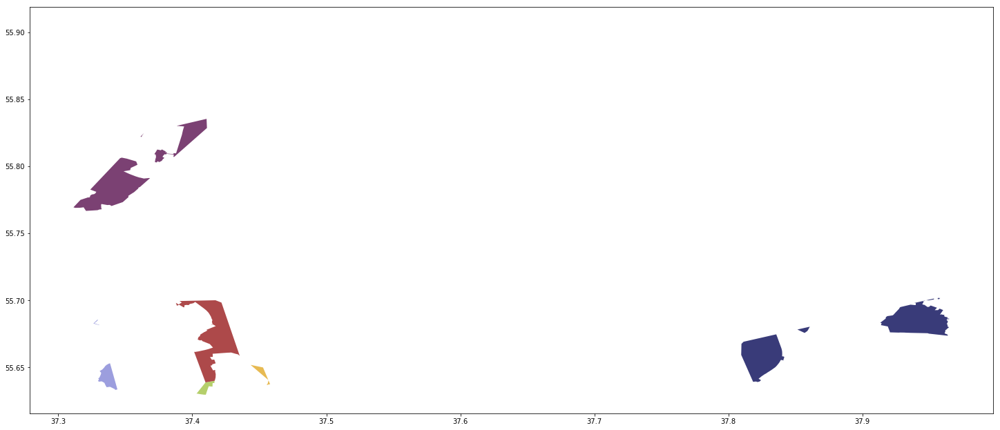

In [135]:
newdf[newdf['name_line'] == "False"].plot(cmap='tab20b', figsize = (25,14))

#### What is it?

In [136]:
m = folium.Map(places[100], tiles = mapa, zoom_start=11)
folium.GeoJson(newdf[newdf['name_line'] == "False"]).add_to(m)

for point, name, color in zip(places, name_station, colors_station):
    folium.CircleMarker(location= point , radius = 6, color = color, fill=True,
      fill_color=color, fill_opacity = 0.7, popup=name).add_to(m)
m

In [164]:
m = folium.Map(places[100], tiles = mapa, zoom_start=11)
folium.GeoJson(mm).add_to(m)
for point, name, color in zip(places, name_station, colors_station):
    folium.CircleMarker(location= point , radius = 6, color = color, fill=True,
      fill_color=color, fill_opacity = 0.7, popup=name).add_to(m)
filepath = 'data/'+mapa+'_metro_moscow.html'
m.save(filepath)
m

In [137]:
# Мякинино -- 218
# Рассказовка -- 119
# Говорово -- 147
# Румянцево -- 132
# Саларьево -- 125
# Котельники -- 0
# 257 - drop

In [138]:
list_bad_station = [
    ('Мякинино', 218),
    ('Рассказовка', 119),
    ('Говорово ', 147),
    ('Румянцево', 132),
    ('Саларьево', 125),
    ('Котельники', 0)]
for (station, id_poly) in list_bad_station:
    st = gdf_station[gdf_station['name_station'] == station]
    newdf.loc[id_poly, 'name_line'] = st['name_line'].values[0]
    newdf.loc[id_poly, 'name_station'] = st['name_station'].values[0]
    newdf.loc[id_poly, 'color_line'] = st['color_line'].values[0]

In [139]:
newdf[newdf['name_line'] == "False"]

,bbox_east,bbox_north,bbox_south,bbox_west,place_name,geometry,style,name_line,name_station,color_line
257,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.90777343871056 55.70840787960522...,"{'fillColor': '#92F484', 'weight': 2, 'color':...",False,NaN,NaN


In [140]:
newdf = newdf.drop(newdf.index[[257]])

In [141]:
newdf[newdf['name_line'] == "False"]

,bbox_east,bbox_north,bbox_south,bbox_west,place_name,geometry,style,name_line,name_station,color_line


In [142]:
newdf.head()

,bbox_east,bbox_north,bbox_south,bbox_west,place_name,geometry,style,name_line,name_station,color_line
0,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.94701085501507 55.69995013244297...,"{'fillColor': '#C9B6B6', 'weight': 2, 'color':...",Таганско-Краснопресненская,Котельники,943E90
1,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...",(POLYGON ((37.76897706879326 55.60993592679001...,"{'fillColor': '#DA288F', 'weight': 2, 'color':...",Люблинско-Дмитровская,Зябликово,BED12C
2,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.64864094513517 55.57253872070125,...","{'fillColor': '#70F2C2', 'weight': 2, 'color':...",Серпуховско-Тимирязевская,Аннино,ADACAC
3,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.73243159869627 55.59181777634956,...","{'fillColor': '#A666D8', 'weight': 2, 'color':...",Замоскворецкая,Домодедовская,4FB04F
4,37.967428,55.95741,55.491308,37.290502,"Moscow, Central Administrative Okrug, Moscow, ...","POLYGON ((37.70261138487841 55.5810241116383, ...","{'fillColor': '#205402', 'weight': 2, 'color':...",Замоскворецкая,Орехово,4FB04F


### 6.3.8 Getting the square of the area
http://geopandas.org/geometric_manipulations.html#examples-of-geometric-manipulations

In [143]:
from shapely.geometry import Point, LineString, Polygon

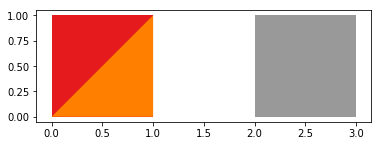

In [144]:
p2 = Polygon([(0, 0), (1, 0), (1, 1)])
p1 = Polygon([(0, 0), (1, 0), (1, 1), (0, 1)])
p3 = Polygon([(2, 0), (3, 0), (3, 1), (2, 1)])
g = gpd.GeoSeries([p1, p2, p3])
g.plot(cmap='Set1')

In [145]:
g.area

0    1.0
1    0.5
2    1.0
dtype: float64

In [146]:
type(p1)

shapely.geometry.polygon.Polygon

In [147]:
# there is multipolygon
type(newdf.geometry[0])

shapely.geometry.multipolygon.MultiPolygon

In [148]:
# there is polygon
type(newdf.geometry[2])

shapely.geometry.polygon.Polygon

In [149]:
# try to give sum square
square_km = 1081
factor_square = 1081/newdf.geometry.area.sum()

In [150]:
newdf['area'] = list((newdf.geometry.area)*factor_square)

In [151]:
vals = np.array(list(newdf['area'].values))

In [152]:
sort_index = np.argsort(vals)

In [156]:
 newdf['index_sort_area'] = [0]*newdf.shape[0]

In [157]:
for i,j in enumerate(sort_index):
    newdf['index_sort_area'][j] = newdf.shape[0] - i

/home/evgenii/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [160]:
newdf.sort_values(by='index_sort_area').iloc[:,[8,10]].head(15)

,name_station,area
256,Пятницкое шоссе,20.633538
253,Алтуфьево,19.326349
118,Щелковская,19.105075
188,Крылатское,18.258316
113,Белокаменная,18.116215
254,Планерная,17.644756
107,Новокосино,16.555242
168,Молодежная,15.727199
116,Бульвар Рокоссовского,15.673676
7,Царицыно,15.354305


### 6.3.9 Plotting

In [229]:
for i in range(newdf.shape[0]):
    newdf.loc[i,'style'] = [{'fillColor': '#' + newdf.loc[i,'color_line'], 'weight': 2, 'color': '#084DAF'}]

In [230]:
json_df_voronoi = json.loads(newdf.to_json())

In [269]:
mapa = maps_version[0]
m = folium.Map(places[100], tiles = mapa, zoom_start=11)
folium.GeoJson(newdf).add_to(m)
# highlight_function=lambda feature: {'fillOpacity' : 0.1, 'weight' : 3.5}

for n_area in range(newdf.shape[0]):
    gj = folium.GeoJson(
        data={
            'type': json_df_voronoi['features'][n_area]['geometry']['type'],
            'coordinates': json_df_voronoi['features'][n_area]['geometry']['coordinates']
        },
        style_function = lambda feature: json_df_voronoi['features'][n_area]['properties']['style'],
        highlight_function=lambda feature: {'weight' : 4})
    gj.add_child(folium.Popup(json_df_voronoi['features'][n_area]['properties']['name_station']))
    gj.add_to(m)
plugins.HeatMap(places,radius=20,overlay=False, max_val=50).add_to(m)
plugins.MarkerCluster(places).add_to(m)

for point, name, color in zip(places, name_station, colors_station):
    folium.CircleMarker(location= point , radius = 6, color = color, fill=True,
      fill_color=color, fill_opacity = 0.7, popup=name).add_to(m)

# save as html file then display map as an iframe
filepath = 'data/'+mapa+'_itog_color_demo_moscow.html'
m.save(filepath)
m

## The end

# P. S. 

### Other metrics

In [33]:
width = 800
height = 800
imgx, imgy = (800,800)
num_cells = 30
nx = []
ny = []
nr = []
ng = []
nb = []
for i in range(num_cells):
    nx.append(random.randrange(imgx))
    ny.append(random.randrange(imgy))
    nr.append(random.randrange(256))
    ng.append(random.randrange(256))
    nb.append(random.randrange(256))

In [ ]:
for jj, ii in enumerate(list(np.linspace(0.3,4,75))):
    image = Image.new("RGB", (width, height))
    putpixel = image.putpixel
    for y in range(imgy):
        for x in range(imgx):
            dmin = abs(imgx-1)**ii + abs(imgy-1)**ii
            j = -1
            for i in range(num_cells):
                d = abs(nx[i]-x)**ii + abs(ny[i]-y)**ii
                if d < dmin:
                    dmin = d
                    j = i
            putpixel((x, y), (nr[j], ng[j], nb[j]))
    image.save("images_animate/VoronoiDiagramf_" + str(jj) + ".png", "PNG")

In [24]:
import cv2
import time

win = "Voronoi"
for i in range(39):
    im = cv2.imread("images_animate/VoronoiDiagramf_" + str(i) + ".png")
    cv2.imshow(win, im)
    cv2.waitKey(80)
time.sleep(2)  
cv2.destroyWindow("Voronoi")

In [12]:
HTML('<img src="images/voronoi_m.gif">')

In [13]:
from PIL import Image
import random
import math
 
def generate_voronoi_diagram(width, height, num_cells, metric = 'euclide'):
    image = Image.new("RGB", (width, height))
    if metric == 'euclide':
        dist = euclide
    elif metric == 'manhattan':
        dist = manhattan
    elif metric == 'minkowski_3':
        dist = minkowski_3
    putpixel = image.putpixel
    imgx, imgy = image.size
    nx = []
    ny = []
    nr = []
    ng = []
    nb = []
    for i in range(num_cells):
        nx.append(random.randrange(imgx))
        ny.append(random.randrange(imgy))
        nr.append(random.randrange(256))
        ng.append(random.randrange(256))
        nb.append(random.randrange(256))
    for y in range(imgy):
        for x in range(imgx):
            dmin = dist(imgx-1, imgy-1)
            j = -1
            for i in range(num_cells):
                d = dist(nx[i]-x, ny[i]-y)
                if d < dmin:
                    dmin = d
                    j = i
            putpixel((x, y), (nr[j], ng[j], nb[j]))
    image.save("VoronoiDiagram_" + metric + ".png", "PNG")
    image.show()

In [282]:
def manhattan(x, y):
    return abs(x) + abs(y)
 
def euclide(x, y):
    return math.hypot(x, y)
 
def minkowski_3(x,y):
    return abs(x)**3 + abs(y)**3

In [283]:
generate_voronoi_diagram(500, 500, 25, metric='minkowski_3')

In [286]:
from IPython.display import HTML
HTML('<img src="VoronoiDiagram_minkowski_3.png">')

In [284]:
generate_voronoi_diagram(500, 500, 25, metric='manhattan')

In [287]:
from IPython.display import HTML
HTML('<img src="VoronoiDiagram_manhattan.png">')

In [285]:
generate_voronoi_diagram(500, 500, 25)

In [288]:
from IPython.display import HTML
HTML('<img src="VoronoiDiagram_euclide.png">')